# Benchmark on the subampled 10x Visium HD CRC dataset

In [1]:
import sys
sys.path.append(r'/import/home2/yzengbj/my_project/code')
import SVF

import pandas as pd
import numpy as np
import scanpy as sc
import anndata as ad
import scipy.io
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings("ignore")
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "4"

In [2]:
RAW_PATH = "/import/home2/share/yqzeng/data/CRC"
DATA_PATH = "/import/home2/share/yqzeng/MacSGP/data/CRC"
SAVE_PATH = "/import/home2/share/yqzeng/MacSGP/results/CRC" 

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import combinations
from scipy.stats import pearsonr
from libpysal.weights import KNN
import matplotlib as mpl

mpl.rcParams.update({
    'font.family': 'Helvetica',  
    'font.size': 7,
    'axes.titlesize': 8,
    'axes.labelsize': 7,
    'xtick.labelsize': 6.5,
    'ytick.labelsize': 6.5,
    'axes.linewidth': 0.5,
    'xtick.major.width': 0.5,
    'ytick.major.width': 0.5,
    'xtick.major.size': 2.5,
    'ytick.major.size': 2.5,
    'pdf.fonttype': 42,     
    'ps.fonttype': 42,
    'savefig.dpi': 300,
    'figure.dpi': 150,
})

In [4]:
sample_size = 50000
save_path = os.path.join(SAVE_PATH, f"{sample_size}_spots")

In [5]:
adata_st = sc.read_h5ad(os.path.join(save_path, 'adata_st.h5ad'))

In [6]:
adata_st

AnnData object with n_obs × n_vars = 50000 × 2865
    obs: 'in_tissue', 'array_row', 'array_col', 'library_size', 'alpha'
    var: 'gene_ids', 'feature_types', 'genome', 'gamma'
    uns: 'Spatial_Net', 'log1p', 'spatial'
    obsm: 'count', 'latent', 'proportion', 'spatial'

In [7]:
#adata_st = sc.read_h5ad(os.path.join(DATA_PATH, f"{sample_size}_spots", 'adata_st_processed.h5ad'))

In [17]:
methods = ['mofa', 'spicemix']
factors_mofa = pd.read_csv(os.path.join(save_path, 'mofa', 'factors.csv'), index_col=0)

In [16]:
loadings_mofa = pd.read_csv(os.path.join(save_path, 'mofa', 'loadings.csv'), index_col=0)

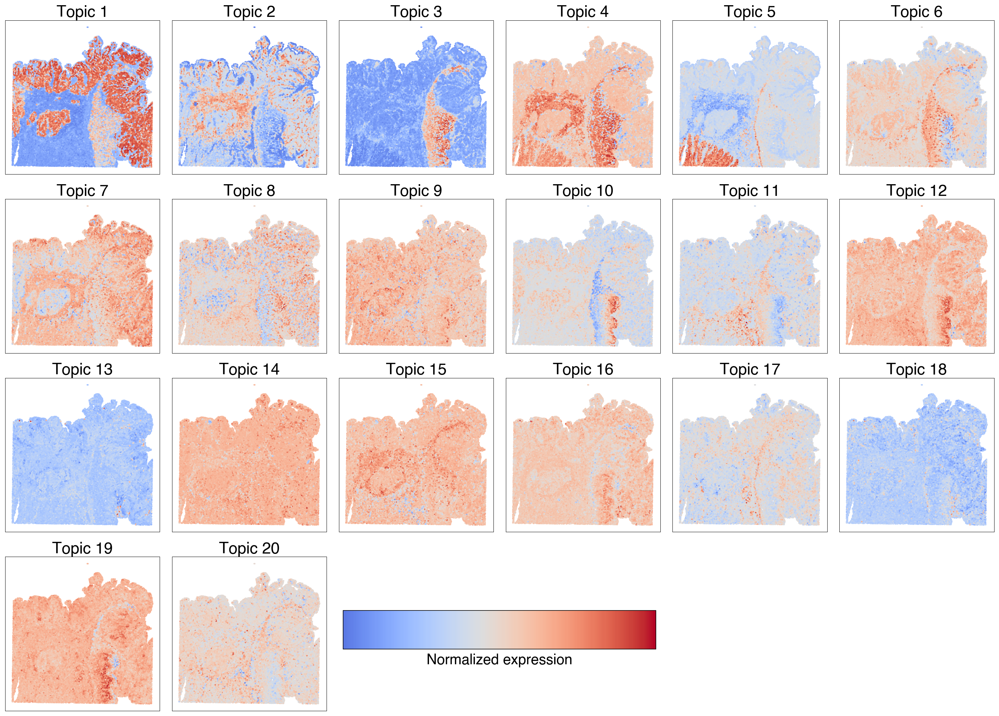

In [ ]:
coordinates_mofa = pd.read_csv(os.path.join(DATA_PATH, f'{sample_size}_spots', f'coordinates_{sample_size}.csv'), index_col=0, ).values
topic_prop = factors_mofa

n_topics = 20
nrows, ncols = 4, 6  

fig, axes = plt.subplots(nrows, ncols, figsize=(20, 15))

def clipped_cmap(base_cmap='Reds', cut=0.15):
    base = plt.get_cmap(base_cmap)
    colors = base(np.linspace(cut, 1.0, 256))
    return mpl.colors.ListedColormap(colors)

cmap = clipped_cmap('coolwarm', cut=0.1)

vals = topic_prop.iloc[:, :n_topics].to_numpy()

norm = mpl.colors.Normalize(vmin=0.0, vmax=1.0)

for i, ax in enumerate(axes.flat[:n_topics]):
    sc = ax.scatter(
        # adata_st.obsm["spatial"][:, 0],
        # adata_st.obsm["spatial"][:, 1],
        coordinates_mofa[:, 0],
        -coordinates_mofa[:, 1],
        c=topic_prop.iloc[:, i],
        s=1,
        cmap=cmap,
        #norm=norm
    )
    ax.set_title(f"Topic {i + 1}", fontsize=22, pad=2)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect('equal', adjustable='box')

for ax in axes.flat[n_topics:]:
    ax.set_visible(False)

fig.subplots_adjust(left=0.03, right=0.99, top=0.97, bottom=0.08,
                    wspace=0.05, hspace=0.16)

ax_cb_left = axes.flat[n_topics]                        
ax_cb_right = axes.flat[n_topics + 1]  

bb_left = ax_cb_left.get_position(fig)
bb_right = ax_cb_right.get_position(fig)
left = bb_left.x0
right = bb_right.x1
bottom = min(bb_left.y0, bb_right.y0)
top = max(bb_left.y1, bb_right.y1)

pad_y = 0.4 * (top - bottom)
cbar_height = 0.25 * (top - bottom)
cbar_bottom = bottom + pad_y
cbar_left = left + 0.02 * (right - left)
cbar_width = 0.96 * (right - left)

cax = fig.add_axes([cbar_left, cbar_bottom, cbar_width, cbar_height])

sm = mpl.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])

cbar = fig.colorbar(sm, cax=cax, orientation='horizontal')
cbar.set_label('Normalized expression', fontsize=20, labelpad=6)
#cbar.set_ticks([0.0, 0.5, 1.0])
cbar.set_ticks([])
cbar.ax.tick_params(labelsize=16)   
cbar.outline.set_linewidth(0.8)

#plt.savefig(os.path.join('/import/home2/share/yqzeng/MacSPG/experiments/mouth_brain_visium/figs', 'mofa_topics_spatial_1.pdf'), dpi=100)
plt.show()

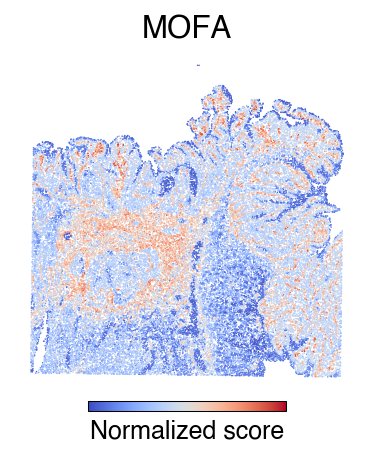

In [36]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
from matplotlib.ticker import MaxNLocator

ct = 'Factor2'
data = factors_mofa[ct]

fig, ax = plt.subplots(figsize=(3.5, 3.2))

sc = ax.scatter(
    coordinates_mofa[:, 0],
    -coordinates_mofa[:, 1],
    c=data,
    s=0.5,
    cmap='coolwarm',
    linewidths=0
)
# cb   = fig.colorbar(sc, ax=ax, shrink=0.4, pad=0.02, orientation='horizontal')
# cb.locator = MaxNLocator(nbins=1)
# cb.update_ticks()
# cb.ax.tick_params(labelsize=12)
#cb.set_label('Proportion', fontsize=12)
cb   = fig.colorbar(sc, ax=ax, shrink=0.4, pad=0.02, orientation='horizontal')
#cb.locator = MaxNLocator(nbins=1)
#cb.update_ticks()
#cb.ax.tick_params(labelsize=0)
cb.set_label('Normalized score', fontsize=12)
# no ticks
cb.set_ticks([])
# 去掉边框
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_linewidth(False)
ax.spines['bottom'].set_linewidth(False)

ax.set_title('MOFA', fontsize=15)
ax.set_xticks([])
ax.set_yticks([])
ax.set_aspect('equal', adjustable='box')
plt.tight_layout()
plt.show()

In [22]:
factors_spicemix = pd.read_csv(os.path.join(save_path, 'spicemix', 'factors.csv'), index_col=0)
loadings_spicemix = pd.read_csv(os.path.join(save_path, 'spicemix', 'loadings.csv'), index_col=0)
coordinates_spicemix = pd.read_csv(os.path.join(save_path, 'spicemix', 'coordinates.csv'), index_col=0, ).values

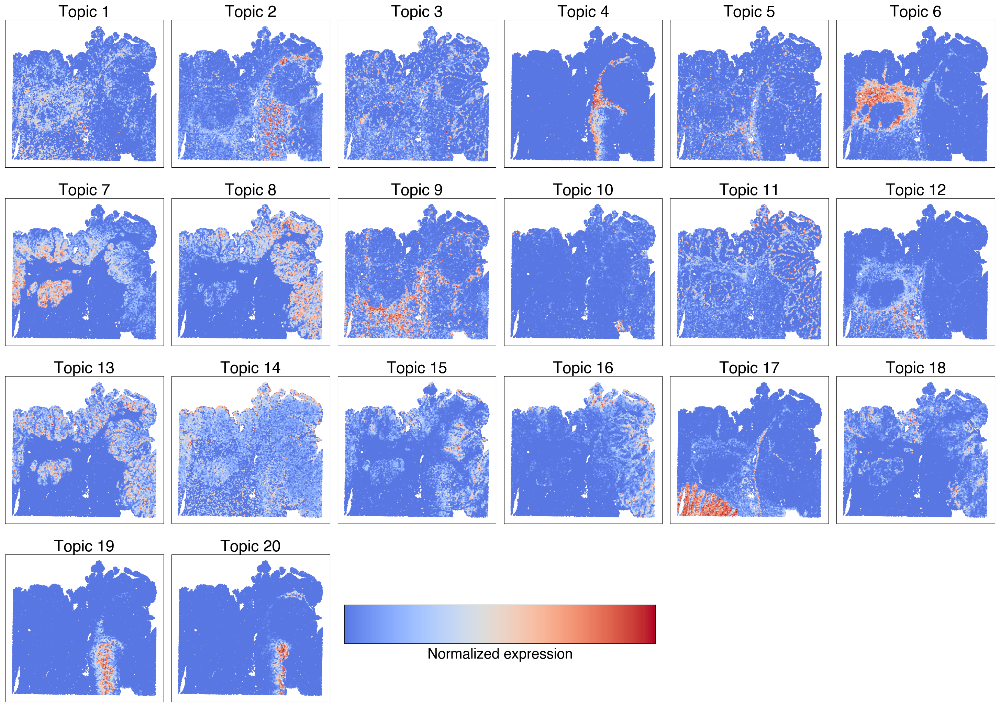

In [ ]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import os
import anndata as ad
import numpy as np
import pandas as pd
import scanpy as sc
import scipy
import matplotlib as mpl
from matplotlib import cm
coordinates = coordinates_spicemix
topic_prop = factors_spicemix

n_topics = 20
nrows, ncols = 4, 6

fig, axes = plt.subplots(nrows, ncols, figsize=(20, 15))

def clipped_cmap(base_cmap='Reds', cut=0.15):
    base = plt.get_cmap(base_cmap)
    colors = base(np.linspace(cut, 1.0, 256))
    return mpl.colors.ListedColormap(colors)

cmap = clipped_cmap('coolwarm', cut=0.1)

vals = topic_prop.iloc[:, :n_topics].to_numpy()

norm = mpl.colors.Normalize(vmin=0.0, vmax=1.0)
for i, ax in enumerate(axes.flat[:n_topics]):
    sc = ax.scatter(
        # adata_st.obsm["spatial"][:, 0],
        # adata_st.obsm["spatial"][:, 1],
        coordinates[:, 0],
        -coordinates[:, 1],
        c=topic_prop.iloc[:, i],
        s=1,
        cmap=cmap,
        #norm=norm
    )
    ax.set_title(f"Topic {i + 1}", fontsize=22, pad=2)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect('equal', adjustable='box')

for ax in axes.flat[n_topics:]:
    ax.set_visible(False)

fig.subplots_adjust(left=0.03, right=0.99, top=0.97, bottom=0.08,
                    wspace=0.05, hspace=0.16)

ax_cb_left = axes.flat[n_topics]     
ax_cb_right = axes.flat[n_topics + 1]  

bb_left = ax_cb_left.get_position(fig)
bb_right = ax_cb_right.get_position(fig)
left = bb_left.x0
right = bb_right.x1
bottom = min(bb_left.y0, bb_right.y0)
top = max(bb_left.y1, bb_right.y1)

pad_y = 0.4 * (top - bottom)
cbar_height = 0.25 * (top - bottom)
cbar_bottom = bottom + pad_y
cbar_left = left + 0.02 * (right - left)
cbar_width = 0.96 * (right - left)

cax = fig.add_axes([cbar_left, cbar_bottom, cbar_width, cbar_height])

sm = mpl.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])

cbar = fig.colorbar(sm, cax=cax, orientation='horizontal')
cbar.set_label('Normalized expression', fontsize=20, labelpad=6)
cbar.set_ticks([])
cbar.ax.tick_params(labelsize=16)   
cbar.outline.set_linewidth(0.8)

#plt.savefig(os.path.join('/import/home2/share/yqzeng/MacSPG/experiments/mouth_brain_visium/figs', 'mofa_topics_spatial_1.pdf'), dpi=100)
plt.show()

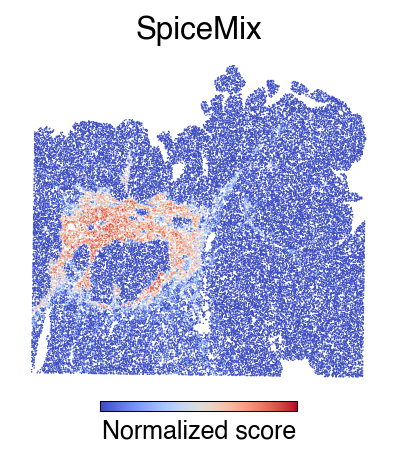

In [ ]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
from matplotlib.ticker import MaxNLocator

ct = 'Factor_5'
data = factors_spicemix[ct]

fig, ax = plt.subplots(figsize=(3.5, 3.2))

sc = ax.scatter(
    coordinates_spicemix[:, 0],
    -coordinates_spicemix[:, 1],
    c=data,
    s=0.5,
    cmap='coolwarm',
    linewidths=0
)
# cb   = fig.colorbar(sc, ax=ax, shrink=0.4, pad=0.02, orientation='horizontal')
# cb.locator = MaxNLocator(nbins=1)
# cb.update_ticks()
# cb.ax.tick_params(labelsize=12)
# #cb.set_label('Proportion', fontsize=12)
cb   = fig.colorbar(sc, ax=ax, shrink=0.4, pad=0.02, orientation='horizontal')
#cb.locator = MaxNLocator(nbins=1)
#cb.update_ticks()
#cb.ax.tick_params(labelsize=0)
cb.set_label('Normalized score', fontsize=12)
# no ticks
cb.set_ticks([])
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_linewidth(False)
ax.spines['bottom'].set_linewidth(False)

ax.set_title('SpiceMix', fontsize=15)
ax.set_xticks([])
ax.set_yticks([])
ax.set_aspect('equal', adjustable='box')
plt.tight_layout()
plt.show()

In [25]:
factors_nmf = pd.read_csv(os.path.join(save_path, 'nmf', 'factors.csv'), index_col=0)
loadings_nmf = pd.read_csv(os.path.join(save_path, 'nmf', 'loadings.csv'), index_col=0)
coordinates_nmf = coordinates_mofa

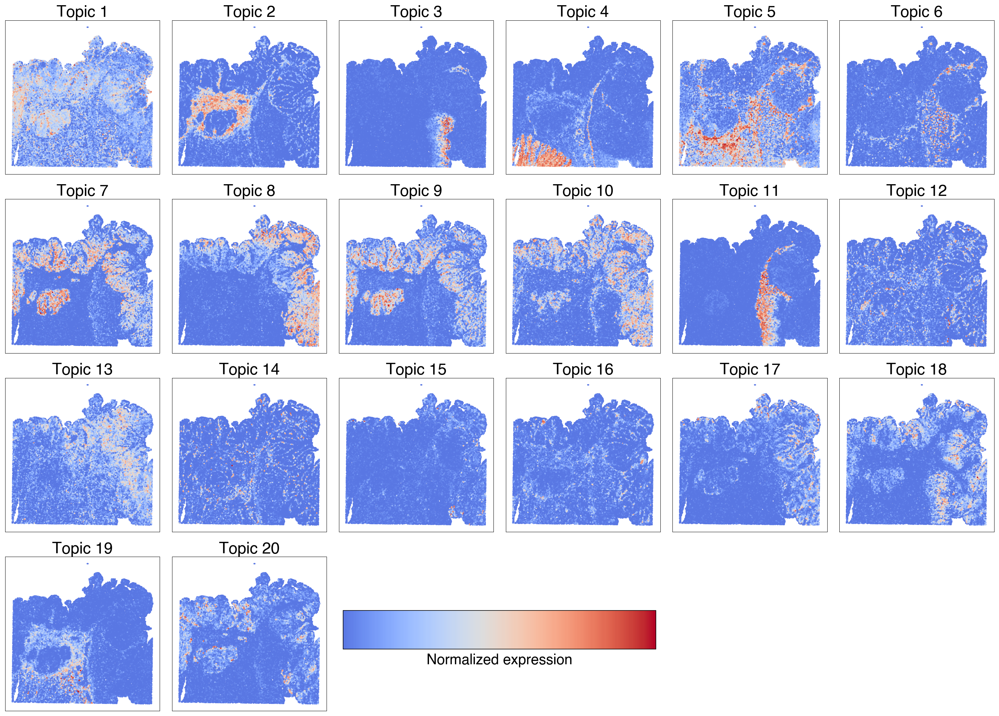

In [ ]:
coordinates = coordinates_mofa
topic_prop = factors_nmf

n_topics = 20
nrows, ncols = 4, 6 

fig, axes = plt.subplots(nrows, ncols, figsize=(20, 15))


def clipped_cmap(base_cmap='Reds', cut=0.15):
    base = plt.get_cmap(base_cmap)
    colors = base(np.linspace(cut, 1.0, 256))
    return mpl.colors.ListedColormap(colors)

cmap = clipped_cmap('coolwarm', cut=0.1)


vals = topic_prop.iloc[:, :n_topics].to_numpy()

norm = mpl.colors.Normalize(vmin=0.0, vmax=1.0)
for i, ax in enumerate(axes.flat[:n_topics]):
    sc = ax.scatter(
        # adata_st.obsm["spatial"][:, 0],
        # adata_st.obsm["spatial"][:, 1],
        coordinates[:, 0],
        -coordinates[:, 1],
        c=topic_prop.iloc[:, i],
        s=1,
        cmap=cmap,
        #norm=norm
    )
    ax.set_title(f"Topic {i + 1}", fontsize=22, pad=2)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect('equal', adjustable='box')

for ax in axes.flat[n_topics:]:
    ax.set_visible(False)

fig.subplots_adjust(left=0.03, right=0.99, top=0.97, bottom=0.08,
                    wspace=0.05, hspace=0.16)

ax_cb_left = axes.flat[n_topics]       
ax_cb_right = axes.flat[n_topics + 1]  

bb_left = ax_cb_left.get_position(fig)
bb_right = ax_cb_right.get_position(fig)
left = bb_left.x0
right = bb_right.x1
bottom = min(bb_left.y0, bb_right.y0)
top = max(bb_left.y1, bb_right.y1)

pad_y = 0.4 * (top - bottom)
cbar_height = 0.25 * (top - bottom)
cbar_bottom = bottom + pad_y
cbar_left = left + 0.02 * (right - left)
cbar_width = 0.96 * (right - left)

cax = fig.add_axes([cbar_left, cbar_bottom, cbar_width, cbar_height])

sm = mpl.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])

cbar = fig.colorbar(sm, cax=cax, orientation='horizontal')
cbar.set_label('Normalized expression', fontsize=20, labelpad=6)
cbar.set_ticks([])
cbar.ax.tick_params(labelsize=16)   
cbar.outline.set_linewidth(0.8)

#plt.savefig(os.path.join('/import/home2/share/yqzeng/MacSPG/experiments/mouth_brain_visium/figs', 'mofa_topics_spatial_1.pdf'), dpi=100)
plt.show()

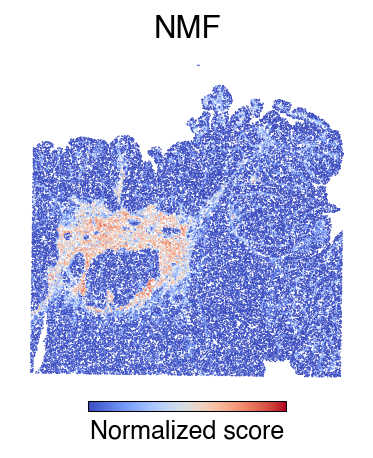

In [ ]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
from matplotlib.ticker import MaxNLocator

ct = 'Factor2'
data = factors_nmf[ct]

fig, ax = plt.subplots(figsize=(3.5, 3.2))

sc = ax.scatter(
    coordinates_nmf[:, 0],
    -coordinates_nmf[:, 1],
    c=data,
    s=0.5,
    cmap='coolwarm',
    linewidths=0
)
# cb   = fig.colorbar(sc, ax=ax, shrink=0.4, pad=0.02, orientation='horizontal')
# cb.locator = MaxNLocator(nbins=1)
# cb.update_ticks()
# cb.ax.tick_params(labelsize=12)
# #cb.set_label('Proportion', fontsize=12)
cb   = fig.colorbar(sc, ax=ax, shrink=0.4, pad=0.02, orientation='horizontal')
#cb.locator = MaxNLocator(nbins=1)
#cb.update_ticks()
#cb.ax.tick_params(labelsize=0)
cb.set_label('Normalized score', fontsize=12)
# no ticks
cb.set_ticks([])

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_linewidth(False)
ax.spines['bottom'].set_linewidth(False)

ax.set_title('NMF', fontsize=15)
ax.set_xticks([])
ax.set_yticks([])
ax.set_aspect('equal', adjustable='box')
plt.tight_layout()
plt.show()

In [15]:
import scanpy as sc
adata_macsgp = sc.read_h5ad(os.path.join(save_path, 'adata_result_macsgp.h5ad'))
adata_result_macsgp_new = sc.read_h5ad(os.path.join(save_path, 'adata_result_macsgp_new.h5ad'))

In [16]:
shared_genes = loadings_spicemix.index.intersection(adata_macsgp.var_names)
shared_genes = shared_genes.intersection(loadings_mofa.index).intersection(loadings_nmf.index)
shared_genes

Index(['TNFRSF18', 'MXRA8', 'VWA1', 'PIK3CD', 'PDPN', 'HSPB7', 'EPHA2',
       'PADI2', 'PADI4', 'PLA2G2A',
       ...
       'TSC22D3', 'COL4A5', 'CHRDL1', 'SH2D1A', 'SASH3', 'CD40LG', 'ARHGEF6',
       'BGN', 'L1CAM', 'DKC1'],
      dtype='object', length=1384)

In [17]:
# nmf: 2, spicemix: 5, mofa: 2
loading_ct = np.concatenate([loadings_nmf.loc[shared_genes, 'Factor2'].values.reshape(1, -1), 
                             loadings_mofa.loc[shared_genes, 'Factor2'].values.reshape(1, -1), 
                             loadings_spicemix.loc[shared_genes, 'Factor_5'].values.reshape(1, -1),
                             adata_result_macsgp_new.varm['loading'].loc[shared_genes, 'CAF'].values.reshape(1, -1)
                             ], axis=0)
methods = ['NMF', 'MOFA', 'SpiceMix', 'MacSGP']
loading_ct_df = pd.DataFrame(loading_ct.T, index=shared_genes, columns=methods)

In [48]:
gene_highlighted_selected = [
                    #'COL11A1',
                    'COL1A2',
                    'COL3A1',
                    'COL1A1','SPARC', 'LUM',
                    'MMP2', 'TAGLN',
                    'LGALS1', 'IGFBP3','IGFBP5',
                    'HTRA3',
                    'CXCL14', 'TNC',
                    'COL6A1',
                    'ASPN',
                    'ANGPTL2',  'FCGBP',
                    'PHGR1',
                    'MUC2',]

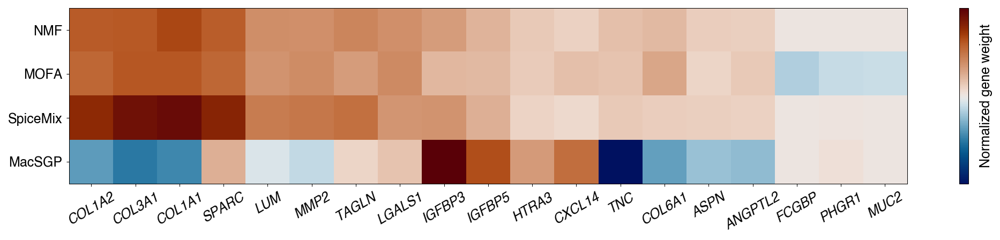

In [ ]:
from matplotlib.colors import TwoSlopeNorm
from cmcrameri import cm
loading_ct_df_normalized = loading_ct_df.div(loading_ct_df.abs().sum(axis=0), axis=1)
loading_ct_df_normalized['MOFA'] = loading_ct_df_normalized['MOFA'] * 2
loading_ct_df_highlight = loading_ct_df_normalized.loc[gene_highlighted_selected, :].copy()
#loading_ct_df_highlight['STAMP'] = loading_ct_stamp_normalized_highlighted
loading_ct_df_highlight = loading_ct_df_highlight[['NMF', 'MOFA', 'SpiceMix', 'MacSGP']]

plt.figure(figsize=(14, 3))
im = plt.imshow(
    loading_ct_df_highlight.T,
    cmap=cm.vik, aspect='auto',
    norm=TwoSlopeNorm(vcenter=0)
)

cbar = plt.colorbar(im)
cbar.set_label('Normalized gene weight', rotation=90, labelpad=10, fontsize=12)

cbar.set_ticks([])

plt.xticks(range(len(gene_highlighted_selected)), gene_highlighted_selected, 
           rotation=30, fontsize=12, fontstyle='italic')
plt.yticks(range(4), ['NMF', 'MOFA', 'SpiceMix', 'MacSGP'],
           fontsize=12)

plt.tight_layout()
plt.show()

In [ ]:
# nmf: 2, spicemix: 5, mofa: 2
loading_ct = np.concatenate([loadings_nmf.loc[shared_genes, 'Factor2'].values.reshape(1, -1), 
                             loadings_mofa.loc[shared_genes, 'Factor2'].values.reshape(1, -1), 
                             loadings_spicemix.loc[shared_genes, 'Factor_5'].values.reshape(1, -1),
                             adata_result_macsgp_new.varm['loading'].loc[shared_genes, 'CAF'].values.reshape(1, -1)
                             ], axis=0)
methods = ['NMF', 'MOFA', 'SpiceMix', 'MacSGP']
loading_ct_df = pd.DataFrame(loading_ct.T, index=shared_genes, columns=methods)

In [21]:
# combine top 10 genes from each method, and check their loading values in other methods
top_genes_spicemix = loadings_spicemix['Factor_5'].sort_values(ascending=False).head(10).index
top_genes_mofa = loadings_mofa['Factor2'].sort_values(ascending=False).head(10).index
low_genes_mofa = loadings_mofa['Factor2'].sort_values(ascending=True).head(5).index
top_genes_nmf = loadings_nmf['Factor2'].sort_values(ascending=False).head(10).index
top_genes_macsgp = adata_macsgp.varm['loading']['CAF'].sort_values(ascending=False).head(10).index
low_genes_macsgp = adata_macsgp.varm['loading']['CAF'].sort_values(ascending=True).head(10).index

# union of all top genes
top_genes_all = set(top_genes_spicemix) | set(top_genes_mofa) | set(top_genes_nmf) | set(top_genes_macsgp) | set(low_genes_mofa) | set(low_genes_macsgp)
len(top_genes_all)

31

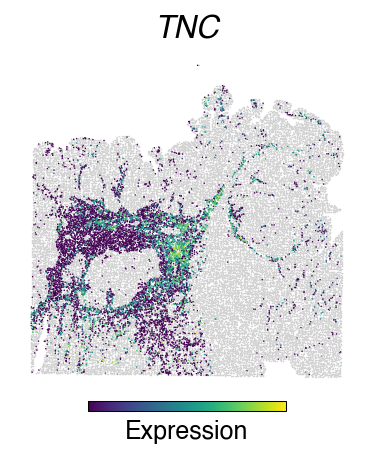

In [ ]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
from matplotlib.ticker import MaxNLocator

ct = 'TNC'
data = adata_macsgp[:, ct].X.toarray()
mask = adata_macsgp.obsm['proportion']['CAF'] > 0.1

fig, ax = plt.subplots(figsize=(3.5, 3.2))
background = ax.scatter(
    adata_macsgp.obsm['spatial'][:, 0],
    -adata_macsgp.obsm['spatial'][:, 1],
    c='lightgray',
    s=0.5,
    linewidths=0
)
sc = ax.scatter(
    adata_macsgp.obsm['spatial'][mask, 0],
    -adata_macsgp.obsm['spatial'][mask, 1],
    c=data[mask],
    s=0.5,
    cmap='viridis',
    linewidths=0
)
# cb   = fig.colorbar(sc, ax=ax, shrink=0.4, pad=0.02, orientation='horizontal')
# cb.locator = MaxNLocator(nbins=1)
# cb.update_ticks()
# cb.ax.tick_params(labelsize=12)
# #cb.set_label('Proportion', fontsize=12)
cb   = fig.colorbar(sc, ax=ax, shrink=0.4, pad=0.02, orientation='horizontal')
#cb.locator = MaxNLocator(nbins=1)
#cb.update_ticks()
#cb.ax.tick_params(labelsize=0)
cb.set_label('Expression', fontsize=12)
# no ticks
cb.set_ticks([])
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_linewidth(False)
ax.spines['bottom'].set_linewidth(False)

ax.set_title(ct, fontsize=15, fontstyle='italic')
ax.set_xticks([])
ax.set_yticks([])
ax.set_aspect('equal', adjustable='box')
plt.tight_layout()
plt.show()

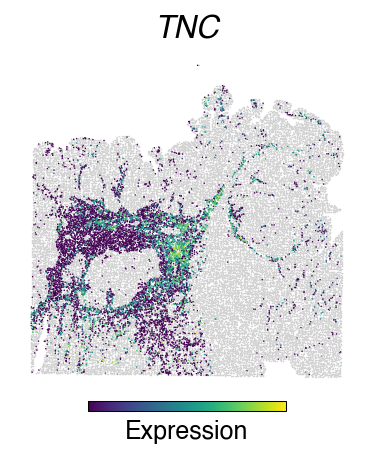

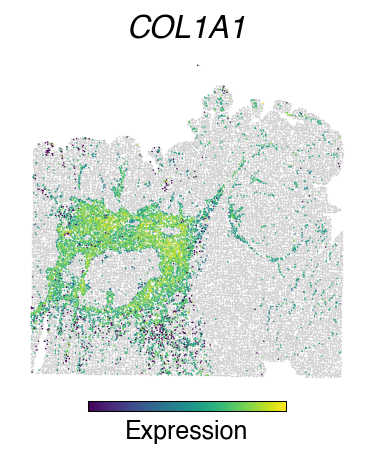

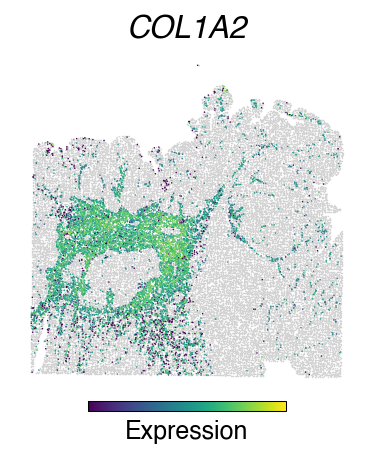

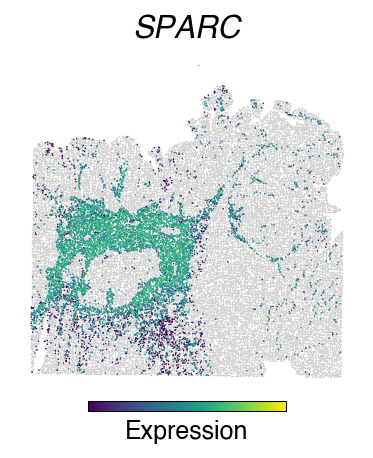

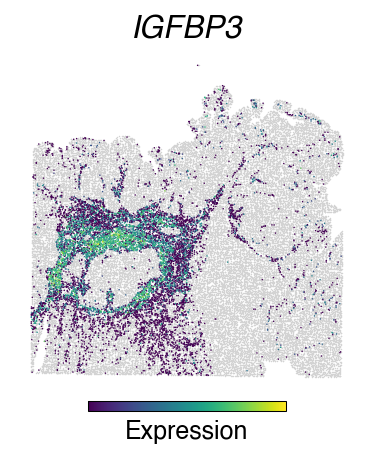

In [ ]:

gene_list = ['TNC', 'COL1A1', 'COL1A2', 'SPARC', 'IGFBP3',]

mask = adata_macsgp.obsm['proportion']['CAF'] > 0.1
for gene in gene_list:
    data = adata_macsgp[:, gene].X.toarray()
    fig, ax = plt.subplots(figsize=(3.5, 3.2))
    background = ax.scatter(
        adata_macsgp.obsm['spatial'][:, 0],
        -adata_macsgp.obsm['spatial'][:, 1],
        c='lightgray',
        s=0.5,
        linewidths=0
    )
    sc = ax.scatter(
        adata_macsgp.obsm['spatial'][mask, 0],
        -adata_macsgp.obsm['spatial'][mask, 1],
        c=data[mask],
        s=0.5,
        cmap='viridis',
        linewidths=0
    )

    cb   = fig.colorbar(sc, ax=ax, shrink=0.4, pad=0.02, orientation='horizontal')

    cb.set_label('Expression', fontsize=12)

    cb.set_ticks([])
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['left'].set_linewidth(False)
    ax.spines['bottom'].set_linewidth(False)

    ax.set_title(gene, fontsize=15, fontstyle='italic')
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect('equal', adjustable='box')
    plt.tight_layout()
    plt.show()